In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import json
import os
import sys

sc.settings.set_figure_params(dpi=80)
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

In [2]:
sys.path.append(os.path.abspath('../'))

In [3]:
from utils import tresholds, layer_palette, apply_percentile_treshold, apply_upper_treshold

### Глобальные переменные

In [4]:
qc_palette = sns.color_palette(['red', 'gray'])

In [5]:
# Define paths and get sample_ids
file_list = os.listdir('../../data/raw_spatial_data/macaque/')
file_list

['macaque_0701', 'macaque_0703', 'macaque_0704', 'macaque_nb0904']

In [6]:
file = 'macaque_0703'

# Подгрузим файлы

In [7]:
# аннотация слоёв
ann = pd.read_csv('../../data/clusters/' + file + '.csv', index_col=0)
ann.columns = ['label']
ann.head()

,label
Barcode,
AAACAACGAATAGTTC-1,L3
AAACAAGTATCTCCCA-1,L2
AAACAATCTACTAGCA-1,L4
AAACACCAATAACTGC-1,L5
AAACAGAGCGACTCCT-1,Empty spots


In [8]:
# каунты секвенирования
adata = sc.read_visium('../../data/raw_spatial_data/macaque/'+ file)
adata.var_names_make_unique()
adata.obs['label'] = ann.label
adata.obs['sample_id'] = file

reading ..\..\data\raw_spatial_data\macaque\macaque_0703\filtered_feature_bc_matrix.h5
 (0:00:01)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Проверим все ли споты имеют аннотацию

In [9]:
adata.obs.label.notna().value_counts()

True    3867
Name: label, dtype: int64

In [10]:
adata.obs.label.value_counts()

L3             1319
L5              637
L2              410
L4              378
L6a             346
WM              216
L1              201
L6b             193
Empty spots     167
Name: label, dtype: int64

# adata

## Посчитаем метрики

In [11]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['hb'] = adata.var_names.str.contains(("^HB[AB]"))
adata.var['ribo'] = adata.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=['mt','hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

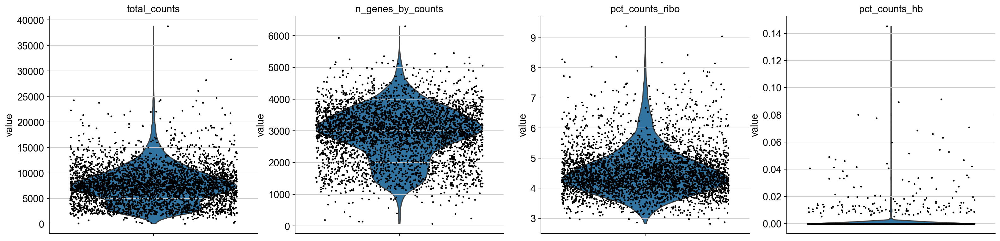

In [12]:
sc.pl.violin(adata,
             keys = ['total_counts', 'n_genes_by_counts','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, rotation= 45, multi_panel=True, size=2.5)

Посмотрим отдельно по разным слоям

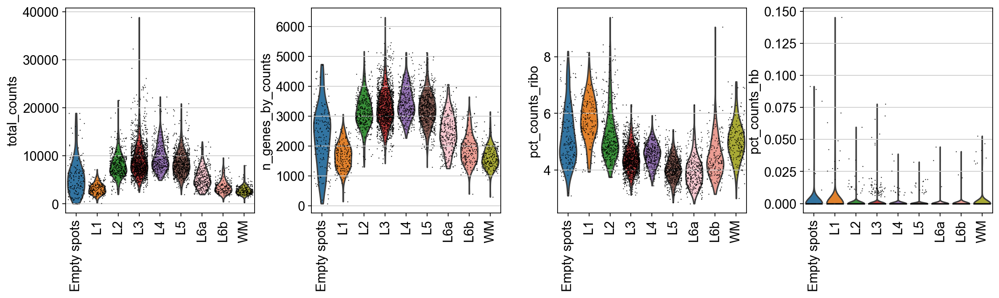

In [13]:
sc.pl.violin(adata,
             keys = ['total_counts', 'n_genes_by_counts','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'label', rotation= 90, palette=layer_palette)

Посмотрим пространственное распределение метрик

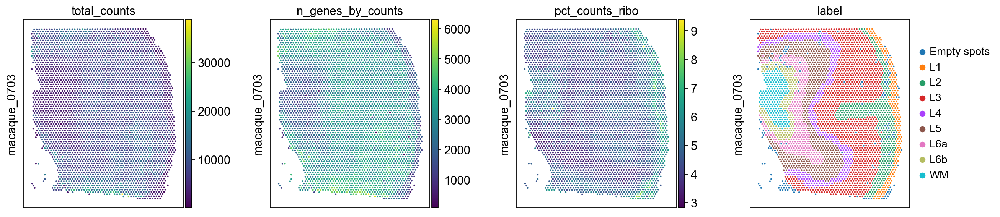

In [14]:
sq.pl.spatial_scatter(adata,
                      color = ['total_counts', 'n_genes_by_counts','pct_counts_ribo', 'label'],
                      ncols=4, img=False, axis_label=['', file])

### Libriary size

Посмотрим на гистограмму распределения

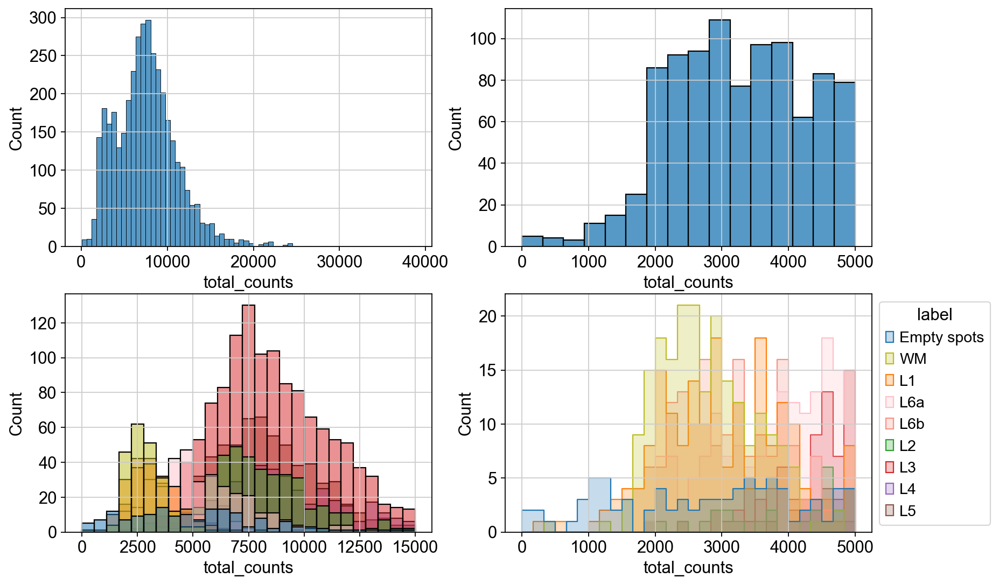

In [15]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6a', 'L6b', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='total_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 15000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='total_counts', binrange=[0, 5000], ax=axs[0][1])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 5000], bins=30, hue='label',fill=True, element="step", hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Посчитаем трешхолды для каждого из слоёв

In [16]:
apply_percentile_treshold(adata, 'total_counts')

Всего образцов не прошедших трешхолд: 86


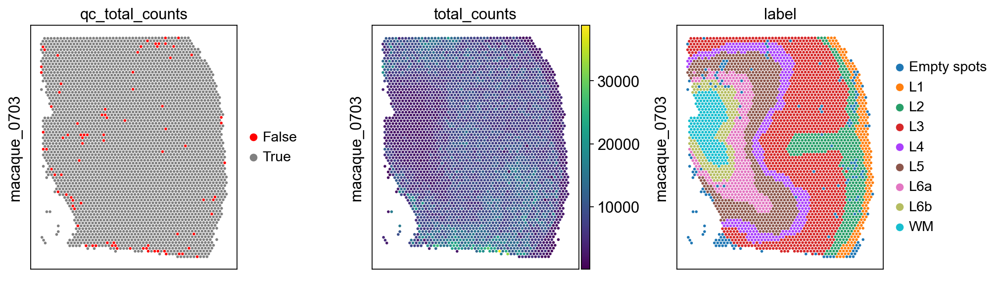

In [17]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_total_counts', 'total_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Number of expressed features

Посмотрим на гистограмму распределения

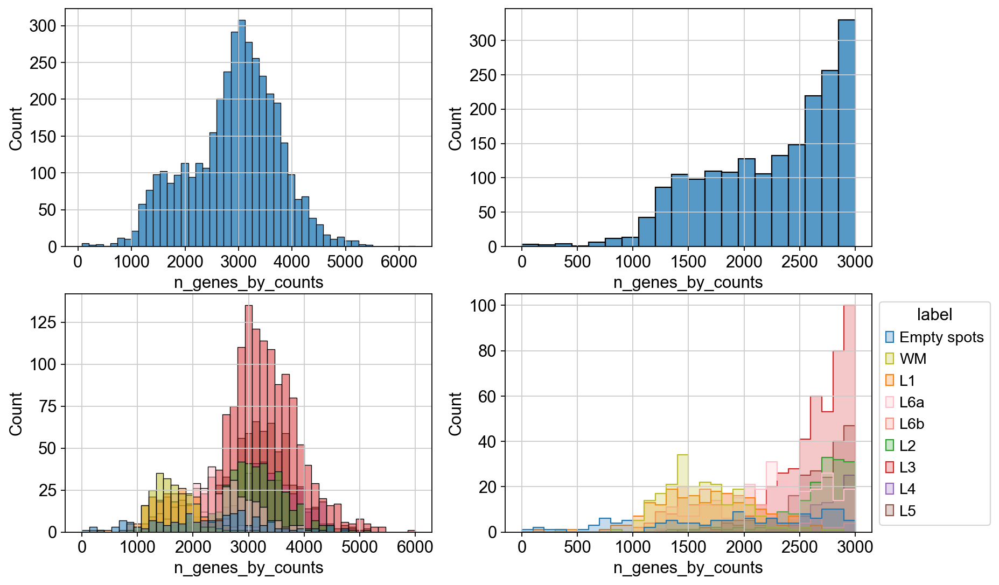

In [18]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6a', 'L6b', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 6000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 3000], ax=axs[0][1])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 3000], bins=30, hue='label',fill=True, element="step", hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Посчитаем трешхолды для каждого из слоёв

In [19]:
apply_percentile_treshold(adata, 'n_genes_by_counts', right_bound=False)

Всего образцов не прошедших трешхолд: 72


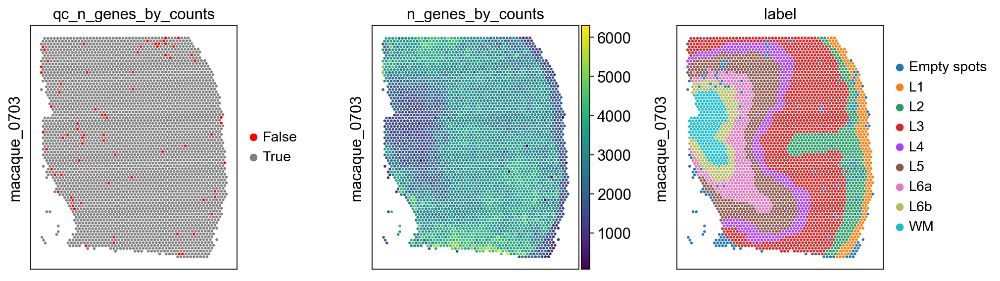

In [20]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_n_genes_by_counts', 'n_genes_by_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of ribosomal reads

In [21]:
apply_upper_treshold(adata, 'pct_counts_ribo')

Трешхолд равняется : 22
Всего образцов не прошедших трешхолд: 0


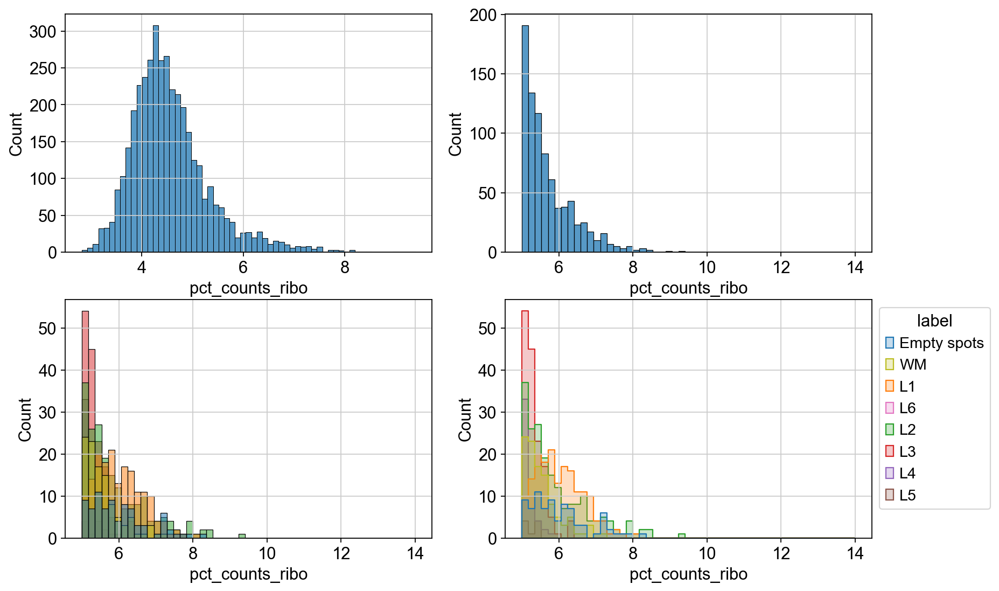

In [22]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='pct_counts_ribo', ax=axs[0][0])
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[5, 14], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[5, 14], ax=axs[0][1])
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[5, 14], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

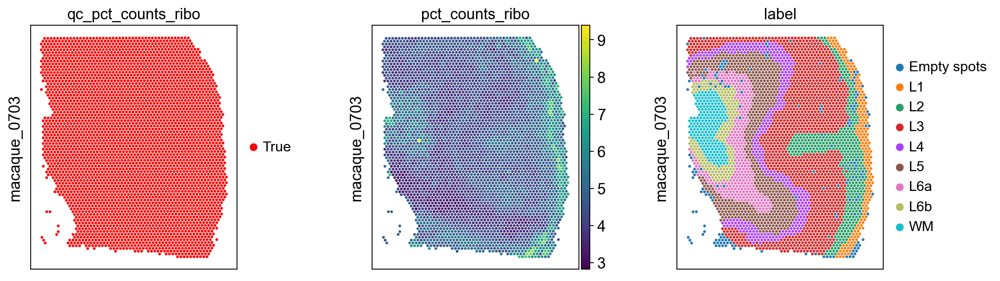

In [23]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_pct_counts_ribo', 'pct_counts_ribo', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of hemoglobin reads

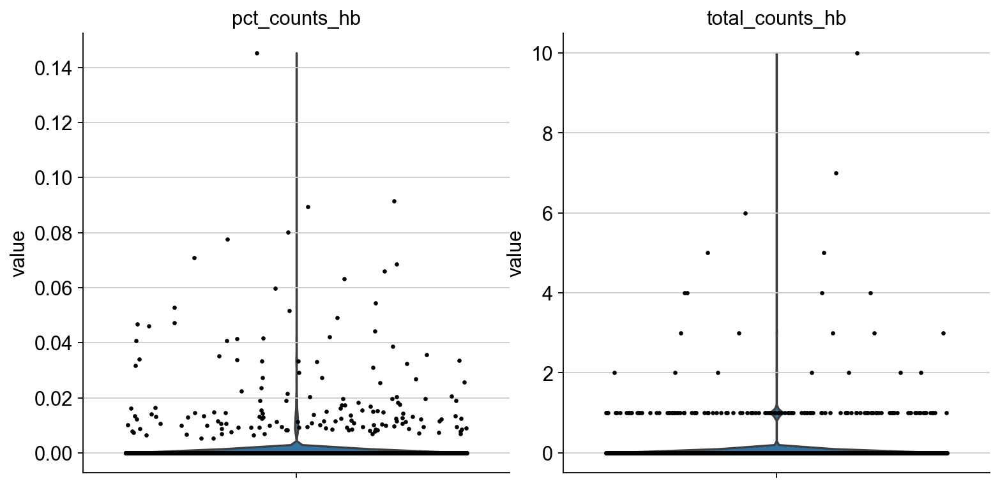

In [24]:
sc.pl.violin(adata,
             keys = ['pct_counts_hb', 'total_counts_hb'], jitter=0.4, size=3, multi_panel=True)

In [25]:
apply_upper_treshold(adata, 'pct_counts_hb')

Трешхолд равняется : 2
Всего образцов не прошедших трешхолд: 0


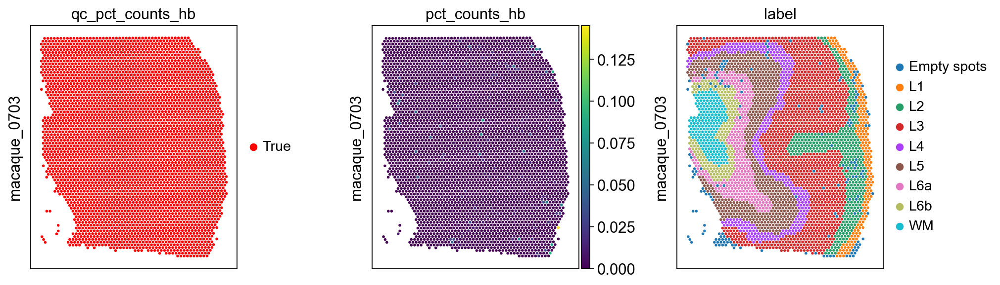

In [26]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_pct_counts_hb', 'pct_counts_hb', 'label'], img=False, axis_label=['', file], size=1.3)

## Combined

### QC spatial_scatter

In [27]:
adata.obs['qc_total_counts'].astype(bool).value_counts()

True    3867
Name: qc_total_counts, dtype: int64

In [28]:
d = {'True': True, 'False': False}
adata.obs['qc_total_counts'].replace(d, inplace=True)
adata.obs['qc_n_genes_by_counts'].replace(d, inplace=True)
adata.obs['qc_pct_counts_ribo'].replace(d, inplace=True)
adata.obs['qc_pct_counts_hb'].replace(d, inplace=True)

In [29]:
adata.obs['qc_good_spots'] = (adata.obs.qc_total_counts.astype(bool) * adata.obs.qc_n_genes_by_counts.astype(bool) *
                              adata.obs.qc_pct_counts_ribo.astype(bool) * adata.obs.qc_pct_counts_hb.astype(bool)).astype('string')
vc = adata.obs.groupby('qc_good_spots')['label'].value_counts()
print(f"Число образцов не прошедших порог N={adata.obs['qc_good_spots'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

Число образцов не прошедших порог N=100

label
L3             30
L5             16
L2             12
L4             12
L6a            10
WM              6
L1              5
L6b             5
Empty spots     4
Name: label, dtype: int64


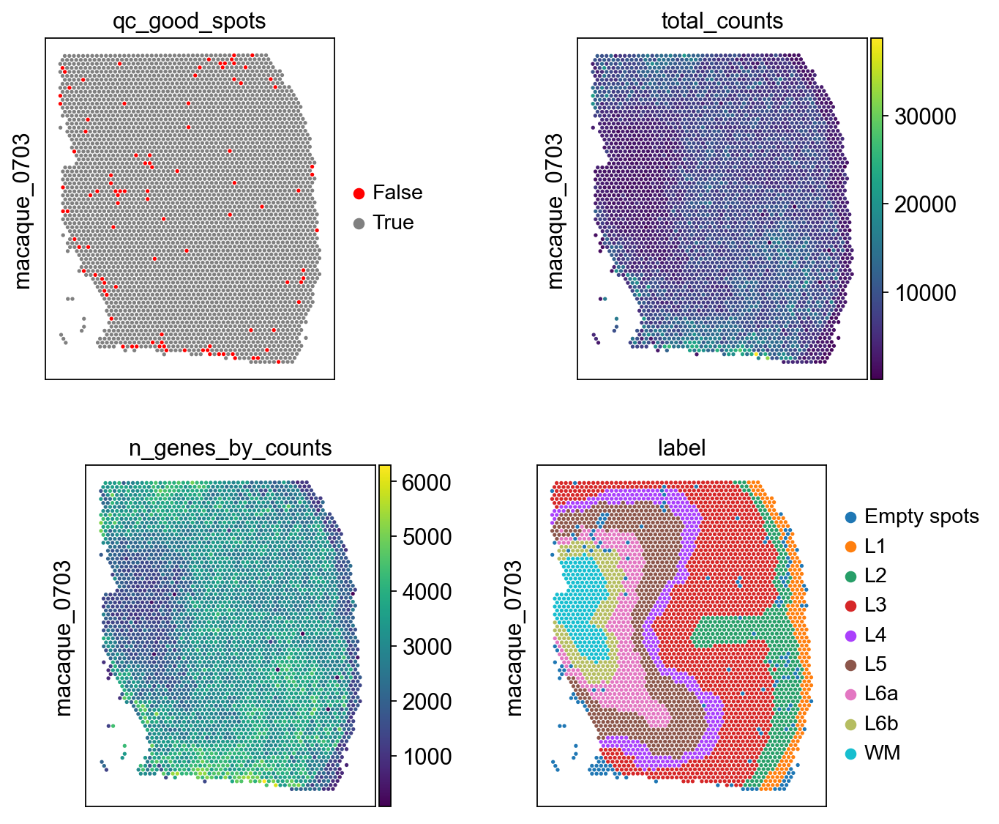

In [30]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_good_spots',  'total_counts', 'n_genes_by_counts', 'label'],
                          img=False, axis_label=['', file], size=1.3, ncols=2)

### QC scatter plots

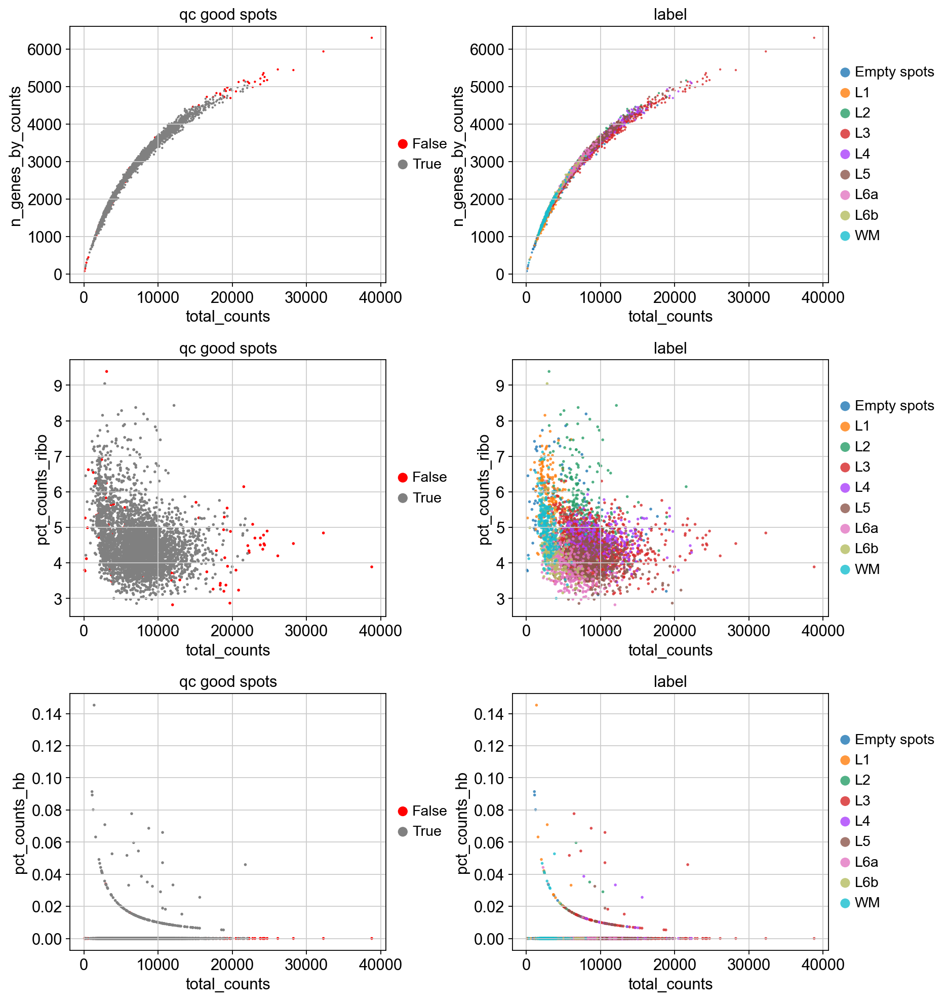

In [31]:
fig, ax = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'wspace': 0.4, 'hspace': 0.3})
alpha = 0.8


sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="qc_good_spots", ax=ax[0][0], show=False, size=15)
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="label", ax=ax[0][1], show=False, alpha=alpha, size=15)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="qc_good_spots", ax=ax[1][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="label", ax=ax[1][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="qc_good_spots", ax=ax[2][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="label", ax=ax[2][1], show=False, alpha=alpha, size=25)

plt.show()

### Cохраним отфильтрованые споты

In [32]:
good_spots = adata.obs[(adata.obs.qc_good_spots == 'True') &
                           (adata.obs.label != 'Empty spots') &
                           (adata.obs.label.notna())].index

In [33]:
adata_filtered = adata[good_spots].copy()

### PCA

In [34]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.tl.pca(adata)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:45)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


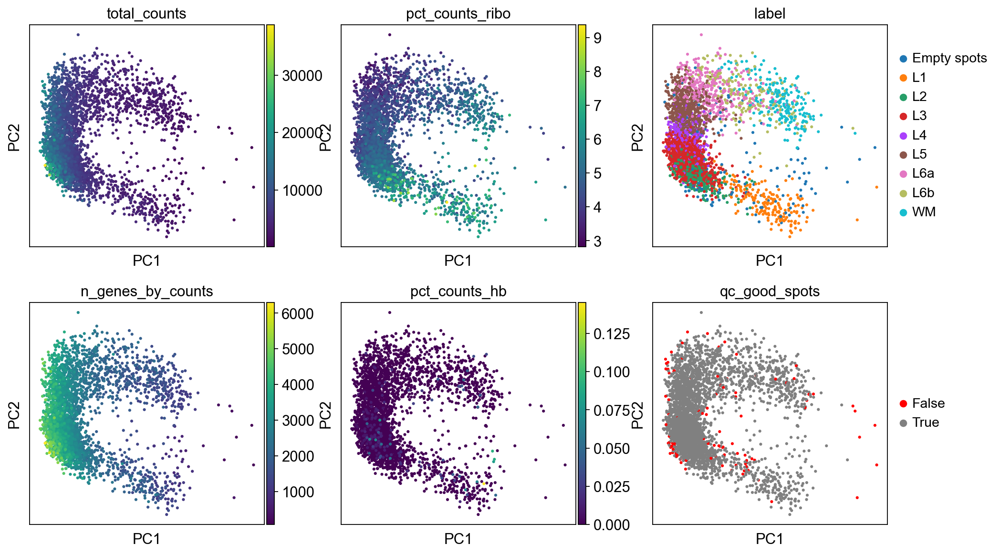

In [35]:
sc.pl.pca(adata, 
          color=['total_counts','pct_counts_ribo', 'label', 'n_genes_by_counts',  'pct_counts_hb', 'qc_good_spots'],
          ncols=3, show=True)

## Сохраним в .h5ad

In [36]:
adata_filtered.obs.drop(['qc_total_counts','qc_n_genes_by_counts', 'qc_good_spots',
                         'qc_pct_counts_hb', 'qc_pct_counts_ribo'], axis=1, inplace=True)

In [37]:
os.makedirs('../../results/filtered_samples', exist_ok=True)
os.makedirs('../../results/filtered_samples/human', exist_ok=True)
adata_filtered.write_h5ad(f'../../results/filtered_samples/macaque/{file}.h5ad')